# NEW YORK AIRBNB

## Goals

- [ ] Visualize the position of the apartments in a map
  - [ ] find trend there
- [ ] Find cheap places to stay
- [ ] Find when reviews are written
- [ ] Check which factors affect the price the most
- [ ] Fit different models
- [ ] ...

But first of all. lets start with the basic stuff, imports and reading the data:

In [1]:
import pandas as pd
import numpy as np
import cufflinks as cf
import plotly.offline as pyo
import seaborn as sns
import matplotlib.pyplot as plt

pyo.init_notebook_mode()
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Then lets read the data into a dataframe and take a look at it:

In [2]:
data = pd.read_csv("AB_NYC_2019.csv") 

data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


## Column descriptions:

**id**: id of the record  
**name**: name of the listing  
**host_id**: id of the host  
**host_name**: name of the host  
**neighbourhood_group**: location  
**neighbourhood**: area  
**latitude**: latitude coordinates
**longitude**: longitude coordinates  
**room_type**: listing space type  
**price**: price in dollars  
**minimum_nights**: minimum nights to spend in the listing  
**number_of_reviews**: number of reviews  
**last_review**: latest review  
**reviews_per_month**: amount of reviews in a month  
**calculated_host_listings_count**: amount of listing per host  
**availability_365**: number of days when listing is available for booking

 ## EDA
 
 Mostl people start with the data cleaning, before the EDA, for me it makes more sense to first take a look at the "dirty" data and then check what needs to be cleaned, clean it and then go on with the EDA!
 
 First lets take a look at our columns:

In [3]:
print(list(data.columns))

['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']


Then take a look at how many NaNs we have/ have not in our dataset, :

In [4]:
print(data.notna().sum(axis = 0))

id                                48895
name                              48879
host_id                           48895
host_name                         48874
neighbourhood_group               48895
neighbourhood                     48895
latitude                          48895
longitude                         48895
room_type                         48895
price                             48895
minimum_nights                    48895
number_of_reviews                 48895
last_review                       38843
reviews_per_month                 38843
calculated_host_listings_count    48895
availability_365                  48895
dtype: int64


In [5]:
print(data.isna().sum(axis = 0))

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


And a general overview of the data:

In [7]:
data.info(null_counts = False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                int64
name                              object
host_id                           int64
host_name                         object
neighbourhood_group               object
neighbourhood                     object
latitude                          float64
longitude                         float64
room_type                         object
price                             int64
minimum_nights                    int64
number_of_reviews                 int64
last_review                       object
reviews_per_month                 float64
calculated_host_listings_count    int64
availability_365                  int64
dtypes: float64(3), int64(7), object(6)
memory usage: 6.0+ MB


### What tells us this

1. NaNs  
   *  We have 2 columns (last_review - 10052, reviews_per_month - 10052) which have quite some NaN values, this probably stems of the fact that they have no review, which is normal and we have to take into account if we work with such a dataset, so fine!  
  * The other 2 columns (name - 16, host_name - 21) are not impacting our data really, so I would suggest simply dropping them!
2. Datatypes:
  * A fear of mine is that we have a lot of wrong datatypes in the set, e.g. numerical columns which have strings in them or stuff like that, but this looks fine, so lets continue!
3. Columns names:
  * They look fine as well, you know what they are directly and are not too long as well!
4. Categorical Values:
  * Todo

## Data cleaning

1. Remove id column
2. Drop records where host_name or name is NaN
3. Bring Categorical Values into numerical ones

No big deal the rest of the data seems pretty good, no \n inbetween strings or null between NaNs or something similar, looks good!

In [3]:
data = data.drop('id', axis=1)
data = data[pd.notnull(data['host_name'])]
data = data[pd.notnull(data['name'])]

print(data.isna().sum(axis = 0))

name                                  0
host_id                               0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10037
reviews_per_month                 10037
calculated_host_listings_count        0
availability_365                      0
dtype: int64


Now re removed the id column and dropped all records where name or hostname is NaN, lets get to number 3, first lets check which columns we can make numerical, we now that from the check of the datatyped of the df (data.dtypes):

* name                                  **object**
* host_name                         **object**
* neighbourhood_group     **object**
* neighbourhood                 **object**
* room_type                          **object**
* last_review                          **object**


We can use the column:
* neighbourhood_group
* neighbourhood
* room_type

The others are simply names that would make no sense!

In [4]:
print("---------------------------------------------")
print("neighbourhood_group:")
print(data.neighbourhood_group.unique())
print("---------------------------------------------")
print("---------------------------------------------")
print("neighbourhood:")
print(data.neighbourhood.unique())
print("---------------------------------------------")
print("---------------------------------------------")
print("room_type:")
print(data.room_type.unique())
print("---------------------------------------------")


---------------------------------------------
neighbourhood_group:
['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']
---------------------------------------------
---------------------------------------------
neighbourhood:
['Kensington' 'Midtown' 'Harlem' 'Clinton Hill' 'East Harlem'
 'Murray Hill' 'Bedford-Stuyvesant' "Hell's Kitchen" 'Upper West Side'
 'Chinatown' 'South Slope' 'West Village' 'Williamsburg' 'Fort Greene'
 'Chelsea' 'Crown Heights' 'Park Slope' 'Windsor Terrace' 'Inwood'
 'East Village' 'Greenpoint' 'Bushwick' 'Flatbush' 'Lower East Side'
 'Prospect-Lefferts Gardens' 'Long Island City' 'Kips Bay' 'SoHo'
 'Upper East Side' 'Prospect Heights' 'Washington Heights' 'Woodside'
 'Brooklyn Heights' 'Carroll Gardens' 'Gowanus' 'Flatlands' 'Cobble Hill'
 'Flushing' 'Boerum Hill' 'Sunnyside' 'DUMBO' 'St. George' 'Highbridge'
 'Financial District' 'Ridgewood' 'Morningside Heights' 'Jamaica'
 'Middle Village' 'NoHo' 'Ditmars Steinway' 'Flatiron District'
 'Roosevelt Isla

There are too many **neighbourhood**'s, and the **neighbourhood_group** also does contain no data which can be ranked in a logical way, so lets leave them away and focus on the **room type**:

In [5]:
data['room_type'] = data['room_type'].replace('Shared room', 0)
data['room_type'] = data['room_type'].replace('Private room', 1)
data['room_type'] = data['room_type'].replace('Entire home/apt', 2)

Why changing to categorical values:
* Easier visualisation, can be shown with colors or forms
* Can be used in heatmaps to see correlatiions

## Visualising

### Heatmap

TODO: describe

In [6]:
pyo.init_notebook_mode()
data.drop('host_id', axis=1).corr().iplot(kind='heatmap',colorscale="blues", title="Feature Correlation Matrix")

### Map of Airbnbs

#### Folium ####

In [7]:
# !pip install folium

import folium
from IPython.display import HTML, display

# Create a map object of the city of New York
new_york_map= folium.Map(location=[40.64749,-73.97237], zoom_start=10)

for index, row in data.iterrows():
    # more can not be displayed properly
    if index < 3000:
        folium.CircleMarker(
            [row['latitude'],row['longitude']],
            radius=3,
            color='red',
            fill=True,
            #popup=row['neighbourhood_group'],
            fill_color='darkred',
            fill_opacity=0.6
        ).add_to(new_york_map)
   
display(new_york_map)

Very interesting to see, now we have a general idea of NEW York, lets check this in more detail in a scatter plot:

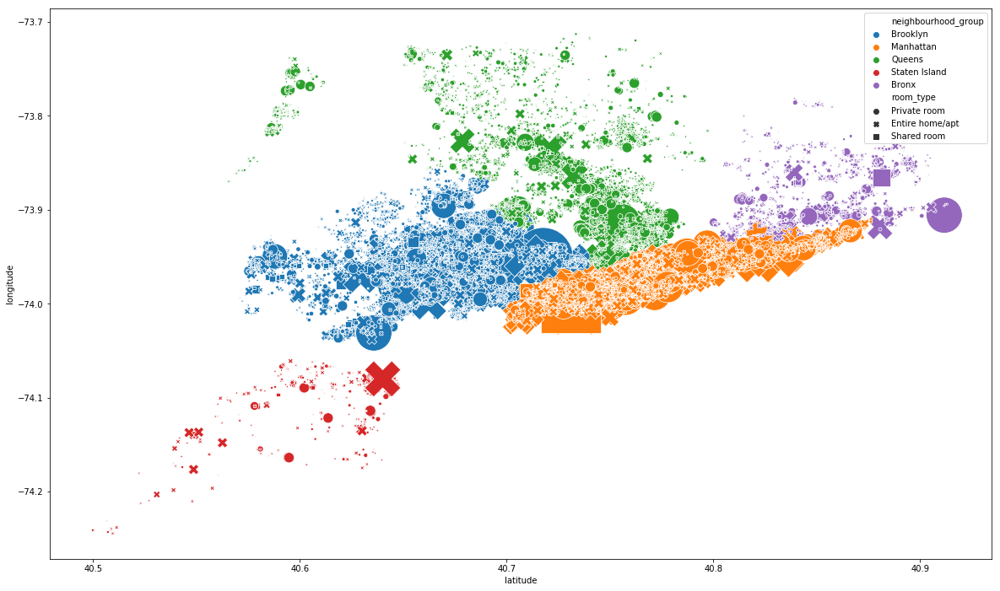

In [12]:
fig = plt.figure(1, figsize=(20,12))

data_scatter = data

data_scatter['room_type'] = data_scatter['room_type'].replace(0, 'Shared room')
data_scatter['room_type'] = data_scatter['room_type'].replace(1, 'Private room')
data_scatter['room_type'] = data_scatter['room_type'].replace(2, 'Entire home/apt')

ax = sns.scatterplot(x="latitude"
                                 , y="longitude"
                                 , data=data
                                 , hue='neighbourhood_group'
                                 , style='room_type'
                                 , s= data['minimum_nights'].values * 5
)

### Pairplot

A pairplot is a very good tool to show correlations as well as the distribution of the data:

In [8]:
data_pairplot = data[['neighbourhood_group'
                                      , 'latitude'
                                      , 'longitude'
                                      , 'room_type'
                                      , 'price'
                                      , 'minimum_nights'
                                      , 'number_of_reviews'
                                      , 'reviews_per_month'
                                      , 'calculated_host_listings_count'
                                      , 'availability_365']].dropna()

data_pairplot = data_pairplot.rename(columns={"calculated_host_listings_count": "host_listings_count"}, errors="raise")

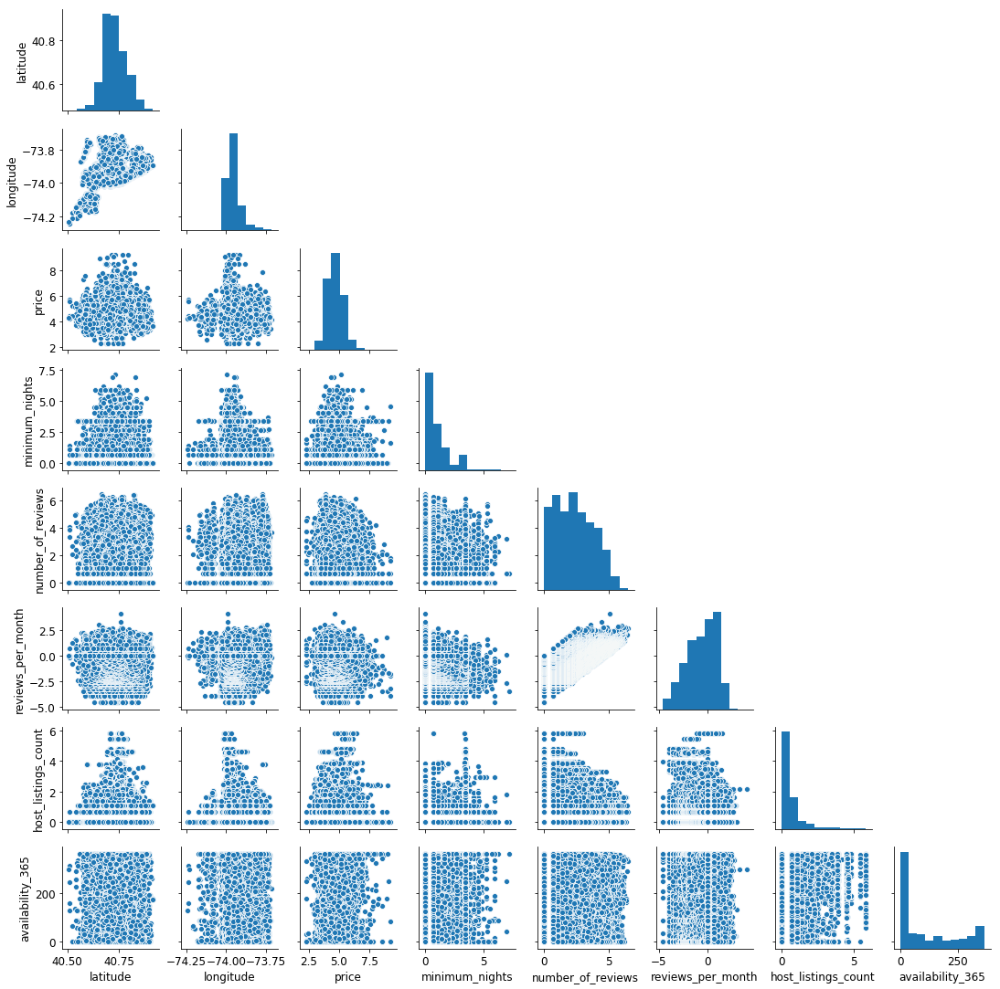

In [129]:
plt.rcParams.update({'font.size': 12})

g = sns.pairplot(data_pairplot)
g.fig.set_size_inches(15,15)

for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

Lets take a look at the pariplot, split up into the different **neighbourhood_group**s

c:\users\jakob engl\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



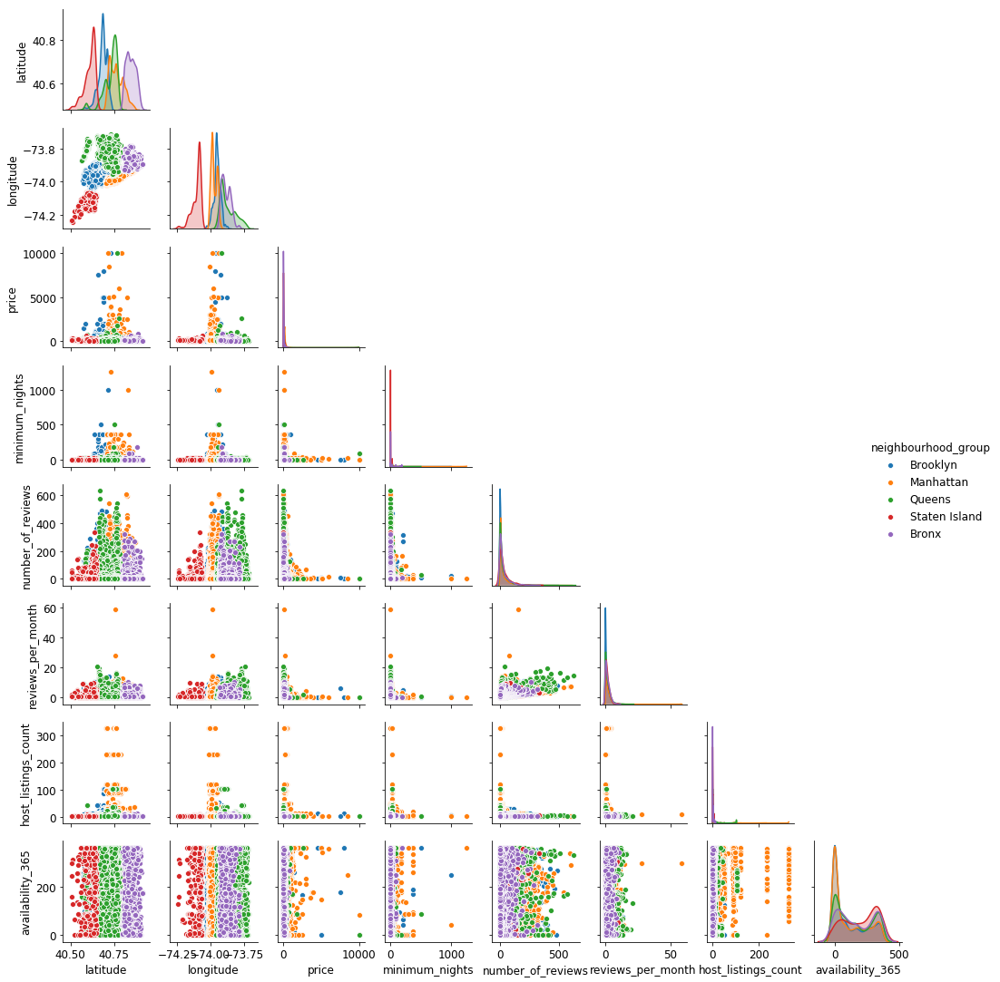

In [14]:
plt.rcParams.update({'font.size': 12})

g = sns.pairplot(data_pairplot, hue='neighbourhood_group')
g.fig.set_size_inches(15,15)

for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

A lot of our features are right-skewed, we can take the log of this values and then take a look at them again:
* price
* minimum_nights
* number of reviews
* reviews per month
* host_listing_count

In [15]:
data_pairplot = data_pairplot[data_pairplot.price != 0]
data_pairplot['price'] = np.log(data_pairplot['price'])
data_pairplot['minimum_nights'] = np.log(data_pairplot['minimum_nights'])
data_pairplot['number_of_reviews'] = np.log(data_pairplot['number_of_reviews'])
data_pairplot['reviews_per_month'] = np.log(data_pairplot['reviews_per_month'])
data_pairplot['host_listings_count'] = np.log(data_pairplot['host_listings_count'])

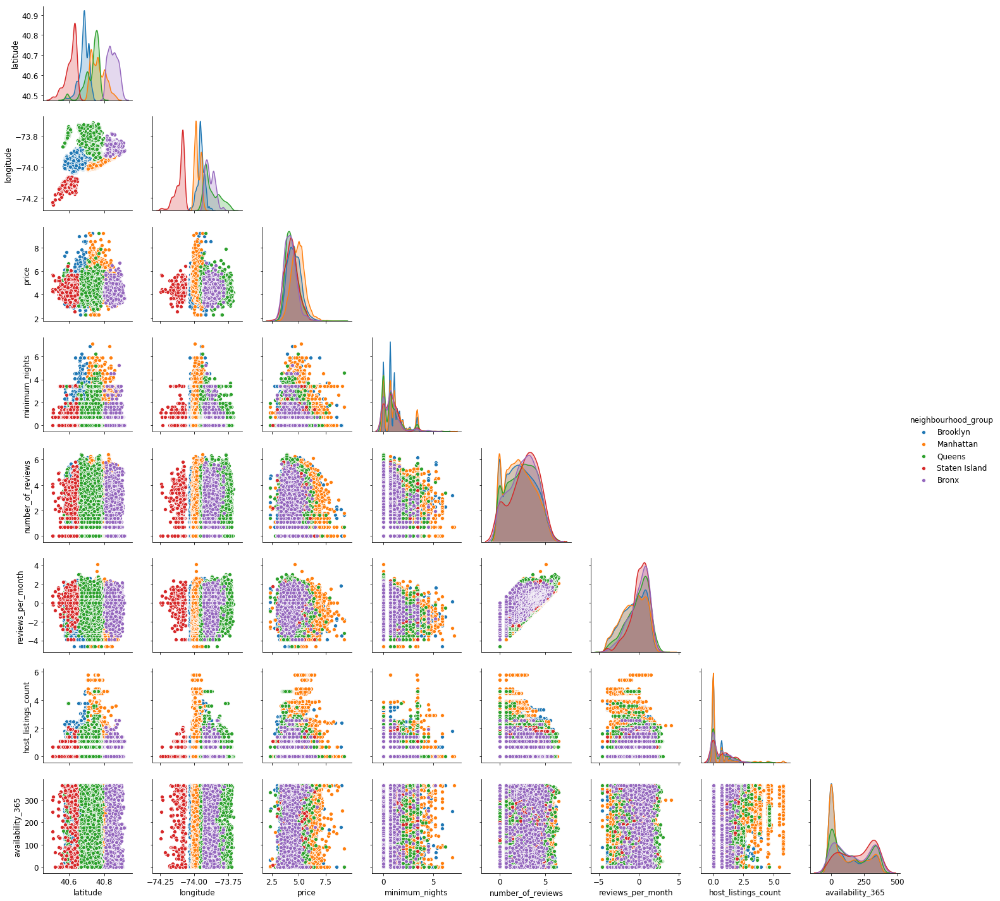

In [16]:
plt.rcParams.update({'font.size': 12})
g.fig.set_size_inches(15,15)

# markers=["o", "s", "D"]
# diag_kind="kde"
g = sns.pairplot(data_pairplot, hue='neighbourhood_group')

for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

Still not perfect, but better there exist other ways as well on how to deal with non-normalized data, but we are not gonna worry to much about that at the moment.

### Pairgrid

Even more insights might give us a so called pairgrid, lets check that out as well:

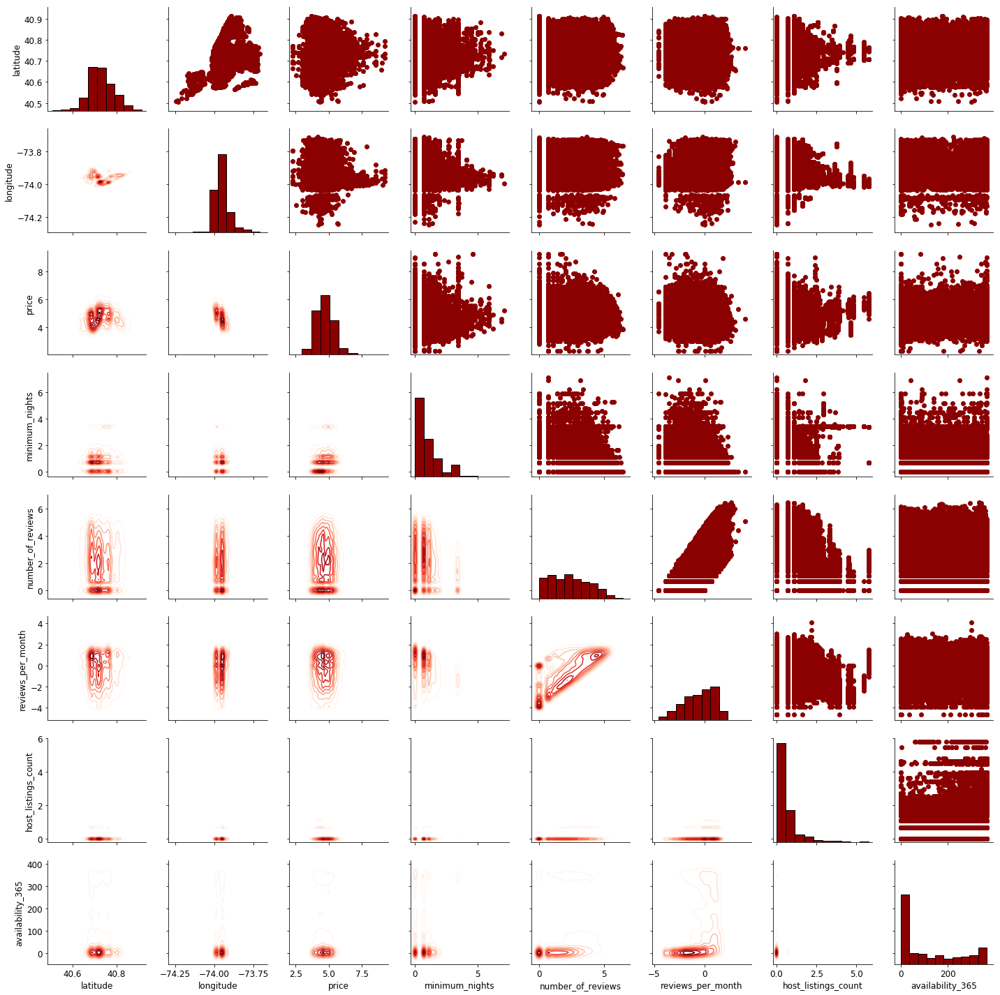

In [17]:
grid = sns.PairGrid(data= data_pairplot, vars = [#'neighbourhood_group'
                                      'latitude'
                                      , 'longitude'
                                      #, 'room_type'
                                      , 'price'
                                      , 'minimum_nights'
                                      , 'number_of_reviews'
                                      , 'reviews_per_month'
                                      , 'host_listings_count'
                                      , 'availability_365'])

grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_diag(plt.hist, bins = 10, color = 'darkred', edgecolor = 'k')
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')


This plot shows us additionally also in the upper left part the density of the values!

### Reviews

Lets get some insights about the reviews!

First thing, the amount of reviews written:

In [9]:
import datetime

#data_test = data[data.last_review < '2019-01-01']
data_test = data

reviews  = data_test.groupby(data_test['last_review'].dropna()).count()

reviews.iplot( kind="scatter"
                          , theme="white"
                          #, x="last_review"
                          , title='distrubution of reviwes written'
                          #, categories="last_review"
                          , y="last_review"
)

reviews['last_review_weekday'] = pd.to_datetime(data['last_review'].dropna()).dt.day_name()
reviews['weekday'] = pd.to_datetime(reviews['last_review'].dropna()).dt.day_name()

The peaks are at the start of a new year, they are probably caused by some missing data which then has been mapped to first of january

In [10]:
reviews_2 = pd.DataFrame() 
#reviews_2['weekday'] = pd.to_datetime(data['last_review'].dropna()).dt

reviews_2['weekday'] = pd.to_datetime(data['last_review'].dropna()).dt.day_name()

reviews_per_day = reviews_2.weekday.value_counts()
reviews_per_day.iplot(kind='bar',title='Reviews per weekday')

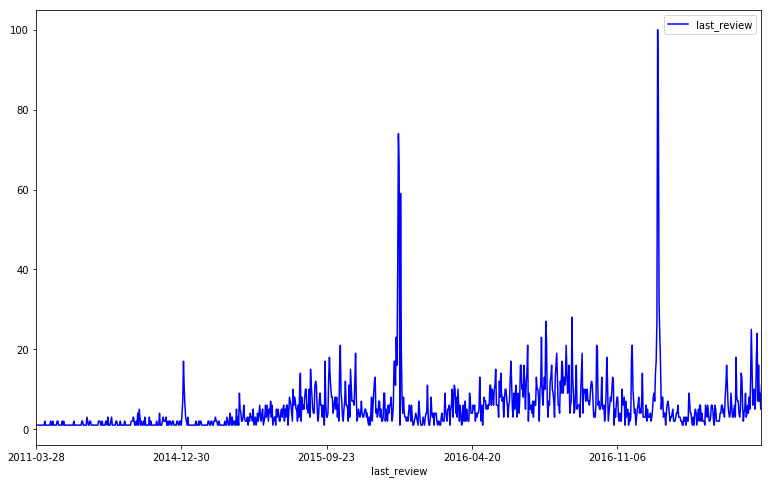

In [45]:
reviews_3 = pd.to_datetime(data['last_review'].dropna(), errors="coerce")
reviews_3 = reviews.head(1000)


reviews_3.last_review.plot(figsize=(13,8), color='blue')

# sunday accidents
#sundays = reviews.groupby(reviews[reviews['date'].dt.dayofweek==6].date.dt.date).count().date
#plt.scatter(sundays.index, sundays, color='green', label='sunday')

# friday accidents
#friday = reviews.groupby(reviews[reviews['date'].dt.dayofweek==4].date.dt.date).count().date
#plt.scatter(friday.index, friday, color='red', label='friday')

# Title, x label and y label
#plt.title('Accidents in Barcelona in 2017', fontsize=20)
#plt.xlabel('Date',fontsize=16)
#plt.ylabel('Number of accidents per day',fontsize=16);
plt.legend()

### Names

Lets take a look at the most common names which are renting airbnbs:

In [11]:
data.host_name
data_per_name = data.host_name.value_counts()
data_per_name.head(20).iplot(kind='bar',title='Reviews per weekday')

## Features

Before we are gonna start we have to decide on which features to use, we are gonna use some algorightms like RFE:


## Model

For this test we are gonna use, three methods of ML:
* Light Gradient-Boosting classifier (LGBM)
* XGBoost classifier
* simple neural network with keras

### Prerequsities 

Split data into training and testing data:

In [21]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(   data[[  'latitude'
                                                                                             , 'longitude'
                                                                                             , 'room_type'
                                                                                             , 'minimum_nights'
                                                                                             , 'calculated_host_listings_count'
                                                                                             , 'availability_365']
                                                                                   ]
                                                                                , data['price']
                                                                                , test_size = .99
                                                                                , random_state = 1
                                                                                , shuffle = True)

#data[['neighbourhood_group'
#    , 'neighbourhood'
#    , 'room_type'
#    , 'minimum_nights'
#    , 'number_of_reviews'
#    , 'last_review'
#    , 'reviews_per_month'
#    , 'calculated_host_listings_count'
#    , 'availability_365']]

#### Decission Tree Regressor ####

In [31]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import r2_score


def performance_metric(y_true, y_predict):
    """ Calculates and returns the performance score between 
        true (y_true) and predicted (y_predict) values based on the metric chosen. """
    
    score = r2_score(y_true, y_predict)
    #print('SCORE: ''+ score)
    
    # Return the score
    return score


def fit_model(X, y):
    """ Performs grid search over the 'max_depth' parameter for a 
        decision tree regressor trained on the input data [X, y]. """
    
    # Create cross-validation sets from the training data
    cv_sets = ShuffleSplit(n_splits = 10, test_size = 0.20, random_state = 0)

    # Create a decision tree regressor object
    regressor = DecisionTreeRegressor()

    # Create a dictionary for the parameter 'max_depth' with a range from 1 to 10
    params = { 'max_depth':[1,2,3,4,5,6,7,8,9,10]
                      , 'criterion': ['friedman_mse', 'mse', 'mae']
                      , 'splitter': ['best', 'random']
                      , 'min_samples_leaf': [1,2,3,4,5,6,7,8,9,10]
                      #, 'min_weight_fraction_leaf': [0, 0.1, 0.2, 0.3, 0.4, 0.5]
                      #, 'max_leaf_nodes':  [None, 2,3,4,5,6,7,8,9,10]
                      #, 'min_impurity_decrease': [0, 1,2,3,4,5,6,7,8,9,10]
                      , 'presort' :[True, False]
    }

    # Transform 'performance_metric' into a scoring function using 'make_scorer' 
    scoring_fnc = make_scorer(performance_metric)

    # Create the grid search cv object --> GridSearchCV()
    grid = GridSearchCV(estimator=regressor, param_grid=params, scoring=scoring_fnc, cv=cv_sets)

    # Fit the grid search object to the data to compute the optimal model
    grid = grid.fit(X, y)

    print(grid.evals_result())
    # Return the optimal model after fitting the data
    return grid.best_estimator_


In [32]:
# Fit the training data to the model using grid search
reg = fit_model(X_train, y_train)

# Produce the value for 'max_depth'
print("Parameter 'max_depth' is '{}' for the optimal model.".format(reg.get_params()['max_depth']))
print("Parameter 'criterion' is '{}' for the optimal model.".format(reg.get_params()['criterion']))
print("Parameter 'splitter' is '{}' for the optimal model.".format(reg.get_params()['splitter']))
print("Parameter 'min_samples_leaf' is '{}' for the optimal model.".format(reg.get_params()['min_samples_leaf']))
print("Parameter 'min_weight_fraction_leaf' is '{}' for the optimal model.".format(reg.get_params()['min_weight_fraction_leaf']))
#print("Parameter 'max_leaf_nodes' is '{}' for the optimal model.".format(reg.get_params()['min_weight_fraction_leaf']))
#print("Parameter 'min_impurity_decrease' is '{}' for the optimal model.".format(reg.get_params()['min_weight_fraction_leaf']))
print("Parameter 'presort' is '{}' for the optimal model.".format(reg.get_params()['min_weight_fraction_leaf']))

Parameter 'max_depth' is '10' for the optimal model.
Parameter 'criterion' is 'friedman_mse' for the optimal model.
Parameter 'splitter' is 'random' for the optimal model.
Parameter 'min_samples_leaf' is '10' for the optimal model.
Parameter 'min_weight_fraction_leaf' is '0.0' for the optimal model.
Parameter 'presort' is '0.0' for the optimal model.


In [46]:
print(reg.feature_importances_)
print("###############")
print(reg.score)

[0.05654165 0.09622176 0.59187121 0.07861287 0.00217572 0.1745768 ]
###############
<bound method RegressorMixin.score of DecisionTreeRegressor(criterion='friedman_mse', max_depth=10,
           max_features=None, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=10, min_samples_split=2,
           min_weight_fraction_leaf=0.0, presort=False, random_state=None,
           splitter='random')>


In [27]:
#data[[   'latitude'
#            , 'longitude'
#          , 'room_type'
#            , 'minimum_nights'
#            , 'calculated_host_listings_count'
#            , 'availability_365']
#            ]

# Lets test the model with a few real world values
airbnb_test_data = [   [40.64749, -73.97237, 1, 1, 5, 365]]  


for i, fuel_usage in enumerate(reg.predict(airbnb_test_data)):
   print("Predicted Price for airbnb {}'s is: {:,.2f}".format(i+1, fuel_usage))

Predicted Price for airbnb 1's is: 166.25


#### LGBM ####

Lets start with this one:

In [ ]:

from sklearn.ensemble import GradientBoostingClassifier

gbm = GradientBoostingClassifier(n_estimators=200, max_depth=6, random_state=1)
gbm.fit(X_train, y_train)

# Check results
train_pred = gbm.predict(X_train)
val_pred = gbm.predict(X_test)
train_accuracy = round(accuracy_score(y_train, train_pred), 4)

print(train_pred)
print(train_accuracy)


#### XG-Booost ####

Won a lot of kaggle challanged, so definitely worth to give it a try:

In [ ]:
'''
xgb_params = {'objective' : 'multi:softmax',
    'eval_metric' : 'mlogloss',
    'eta' : 0.1,
    'max_depth' : 6,
    'num_class' : 3,
    'lambda' : 0.8,
    'estimators' : 200,
    'seed' : seed
}

target_train = y_train.astype('category').cat.codes
target_val = y_val.astype('category').cat.codes

# Transform data into a matrix so that we can use XGBoost
d_train = xgb.DMatrix(X_train, label = target_train)
d_val = xgb.DMatrix(X_val, label = target_val)

# Fit XGBoost
watchlist = [(d_train, 'train'), (d_val, 'validation')]
bst = xgb.train(xgb_params, d_train, 400, watchlist, 
early_stopping_rounds = 50, verbose_eval = 0)

# Check results for XGBoost
train_pred = bst.predict(d_train)
val_pred = bst.predict(d_val)
'''

#### Neural Network ####

Most advanced but also intensive technology, lets try it out:

In [ ]:
'''
# Generator so we can easily feed batches of data to the neural network
def batch_generator(X, y, batch_size, shuffle):
    number_of_batches = X.shape[0]/batch_size
    counter = 0
    sample_index = np.arange(X.shape[0])
    
    if shuffle:
        np.random.shuffle(sample_index)
    while True:
        batch_index = sample_index[batch_size*counter:batch_size*(counter+1)]
        X_batch = X[batch_index,:].toarray()
        y_batch = y[batch_index]
        counter += 1        yield X_batch, y_batch
        if (counter == number_of_batches):
            if shuffle:
                np.random.shuffle(sample_index)
            counter = 0
            
# Initialize sklearn's one-hot encoder class
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded_train = np.array(y_train).reshape(len(y_train), 1)
onehot_encoded_train = onehot_encoder.fit_transform(integer_encoded_train)
integer_encoded_val = np.array(y_val).reshape(len(y_val), 1)
onehot_encoded_val = onehot_encoder.fit_transform(integer_encoded_val)

# Neural network architecture
initializer = keras.initializers.he_normal(seed=seed)
activation = keras.activations.elu
optimizer = keras.optimizers.Adam(lr=0.0002, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
es = EarlyStopping(monitor='val_acc', mode='max', verbose=1, patience=4)
# Build model architecture
model = Sequential()
model.add(Dense(20, activation=activation, kernel_initializer=initializer, input_dim=X_train.shape[1]))
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax', kernel_initializer=initializer))
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
# Hyperparameters
epochs = 15
batch_size = 32
# Fit the model using the batch_generator
hist = model.fit_generator(generator=batch_generator(X_train, onehot_encoded_train, batch_size=batch_size, shuffle=True), epochs=epochs, validation_data=(X_val, onehot_encoded_val), steps_per_epoch=X_train.shape[0]/batch_size, callbacks=[es])
'''